# Find Inference Hyperparameters for Individual 169 in Lung Cancer Control Group

## Show control group data

In [1]:
import erlotinib as erlo

# Get data
data = erlo.DataLibrary().lung_cancer_control_group()

# Create scatter plot
fig = erlo.plots.PDTimeSeriesPlot()
fig.add_data(data, biomarker='Tumour volume')
fig.set_axis_labels(xlabel=r'$\text{Time in day}$', ylabel=r'$\text{Tumour volume in cm}^3$')

# Show figure
fig.show()

**Figure 1:** Visualisation of the measured tumour growth in 8 mice with patient-derived lung cancer implants.

## Build model

In [2]:
# Define mechanistic model
path = erlo.ModelLibrary().tumour_growth_inhibition_model_koch_reparametrised()
mechanistic_model = erlo.PharmacodynamicModel(path)
mechanistic_model.set_parameter_names(names={
    'myokit.tumour_volume': 'Tumour volume in cm^3',
    'myokit.critical_volume': 'Critical volume in cm^3',
    'myokit.drug_concentration': 'Drug concentration in mg/L',
    'myokit.kappa': 'Potency in L/mg/day',
    'myokit.lambda': 'Exponential growth rate in 1/day'})

# Define error model
error_model = erlo.ConstantAndMultiplicativeGaussianErrorModel()

# Compose model and not identified parameters
problem = erlo.ProblemModellingController(mechanistic_model, error_model)
problem.fix_parameters({
    'Drug concentration in mg/L': 0,
    'Potency in L/mg/day': 0})

## Prior Predictive Check

In [3]:
import numpy as np
import pints

# Define prior distribution
log_priors = [
    pints.TruncatedGaussianLogPrior(mean=0.25, sd=0.1, a=0, b=np.inf),   # Initial tumour volume
    pints.TruncatedGaussianLogPrior(mean=1, sd=1, a=0, b=np.inf),        # Critical volume
    pints.TruncatedGaussianLogPrior(mean=0.1, sd=0.1, a=0, b=np.inf),    # Growth rate
    pints.TruncatedGaussianLogPrior(mean=0, sd=0.1, a=0, b=np.inf),      # Sigma base
    pints.TruncatedGaussianLogPrior(mean=0, sd=0.2, a=0, b=np.inf)]      # Sigma rel.
log_prior = pints.ComposedLogPrior(*log_priors)

# Compose prior predictive model
predictive_model = problem.get_predictive_model()
prior_predictive_model = erlo.PriorPredictiveModel(
    predictive_model, log_prior)

# Sample from prior predictive model
times = np.linspace(0, 30)
n_samples = 1000
samples = prior_predictive_model.sample(times, n_samples)

# Illustrate prior predictive model
fig = erlo.plots.PDPredictivePlot()
fig.add_prediction(data=samples, bulk_probs=[0.3, 0.6, 0.9])
fig.set_axis_labels(xlabel=r'$\text{Time in day}$', ylabel=r'$\text{Tumour volume in cm}^3$')
fig.show()

**Figure 2:** Prior predictive model of tumour volume measurement over time. The shaded areas estimate the 0.3, 0.6 and 0.9 bulk probability of the prior predictive distribution by sampling 1000 virtual "measurements" at each of the 50 equidistant time points.

## Find posterior probability distribution

In [4]:
# Create log-posteriors
problem.set_data(data, output_biomarker_dict={'myokit.tumour_volume': 'Tumour volume'})
problem.set_log_prior(log_priors)
log_posteriors = problem.get_log_posterior(individual='169')

# # Set up sampling controller
# sampler = erlo.SamplingController(log_posteriors)
# sampler.set_transform(transform=pints.LogTransformation(n_parameters=5))
# sampler.set_n_runs(5)

# # Run sampling
# n_iterations = 40000
# posterior_samples = sampler.run(n_iterations=n_iterations, show_progress_bar=True)

## Find hyperparameters for good convergence

### Individual 155

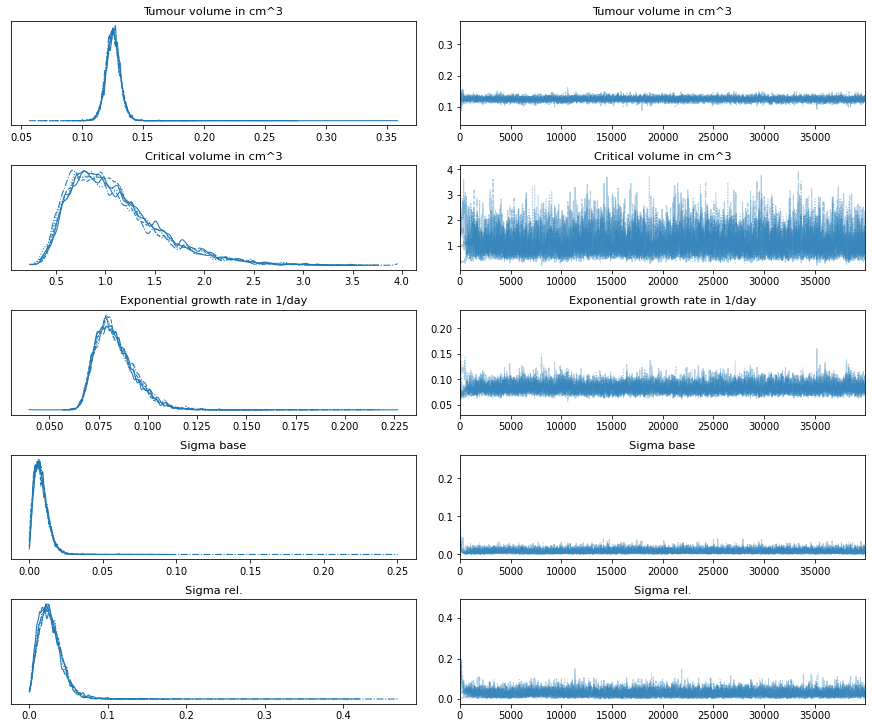

In [7]:
import arviz as az
import matplotlib.pyplot as plt

az.plot_trace(posterior_samples)
plt.show()

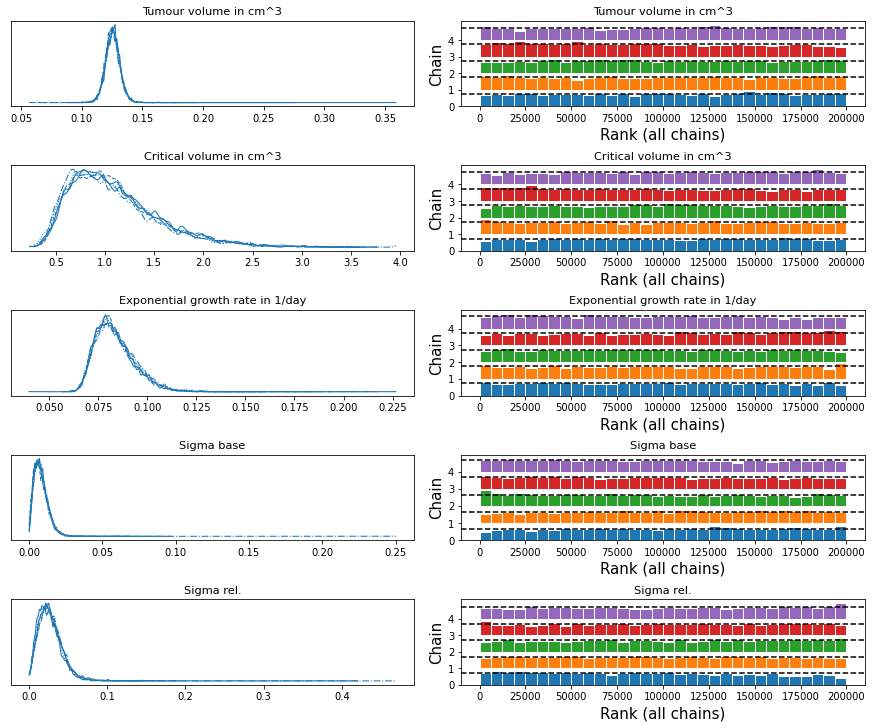

In [8]:
az.plot_trace(posterior_samples, kind='rank_bars')
plt.show()

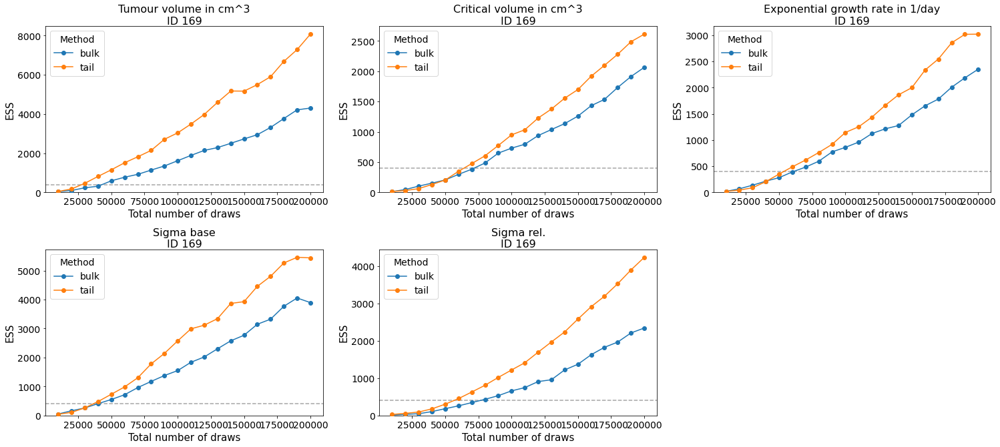

In [9]:
az.plot_ess(posterior_samples, kind="evolution")
plt.show()

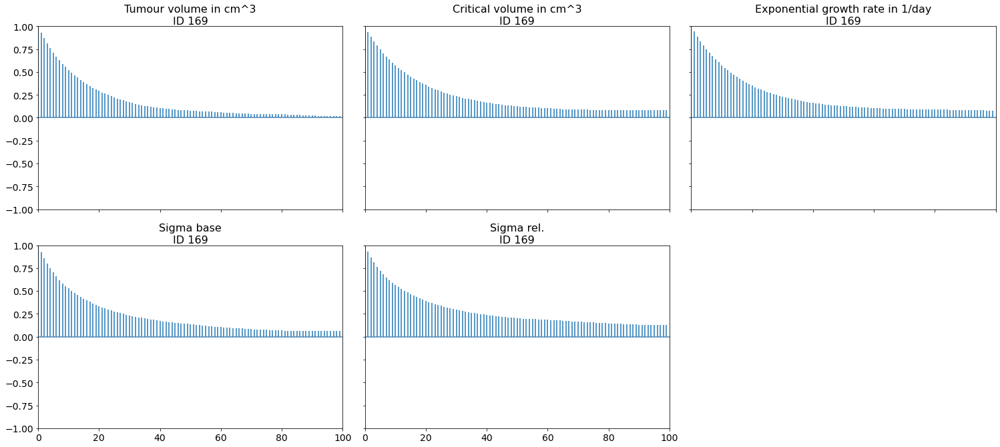

In [10]:
az.plot_autocorr(posterior_samples, combined=True)
plt.show()

### Exclude warmup

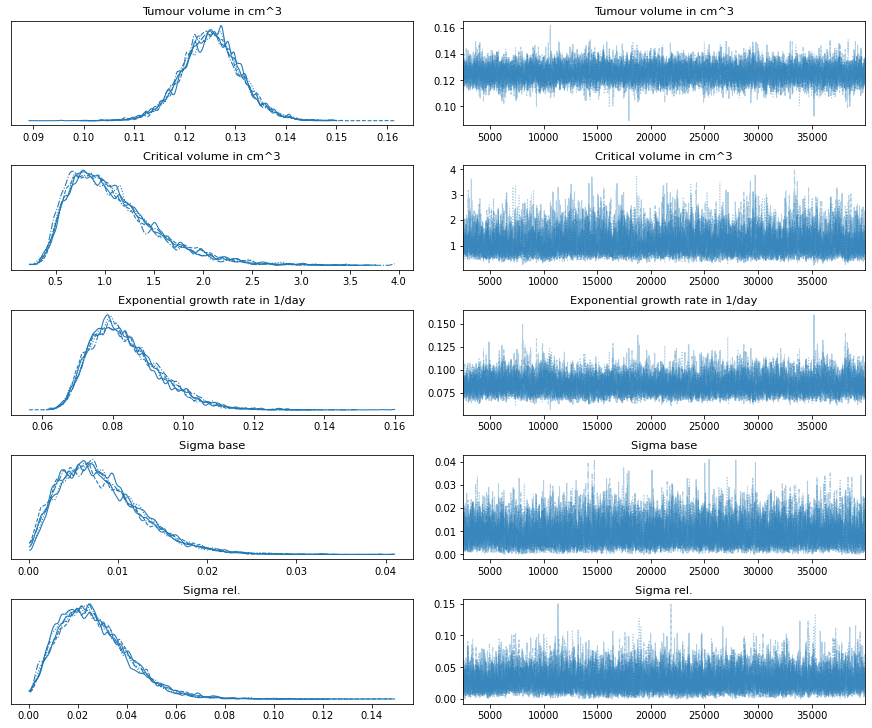

In [11]:
warmup = 2500

az.plot_trace(posterior_samples.sel(draw=slice(warmup, n_iterations)))
plt.show()

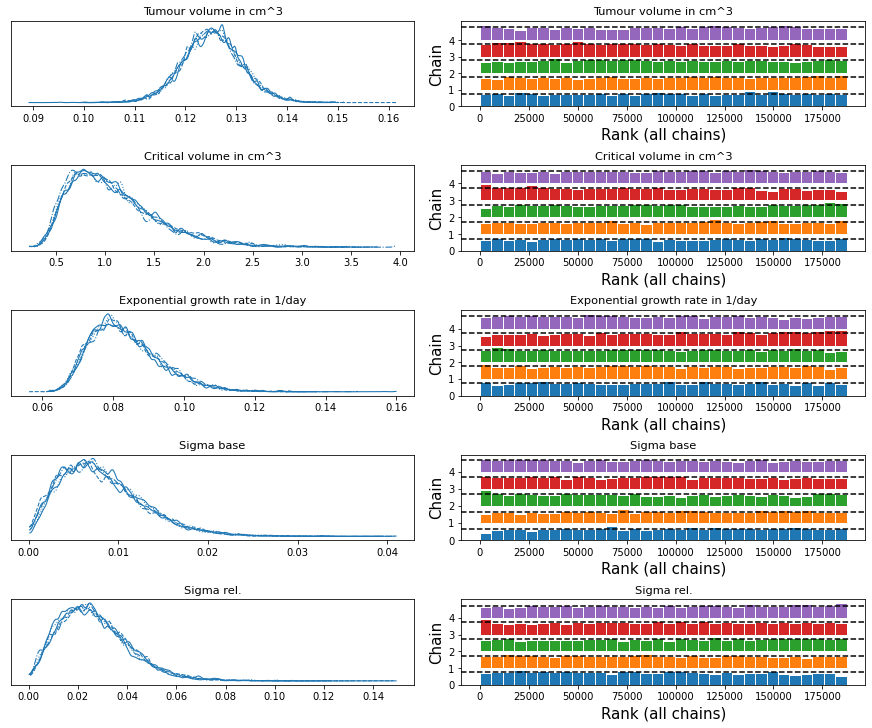

In [12]:
az.plot_trace(posterior_samples.sel(draw=slice(warmup, n_iterations)), kind='rank_bars')
plt.show()

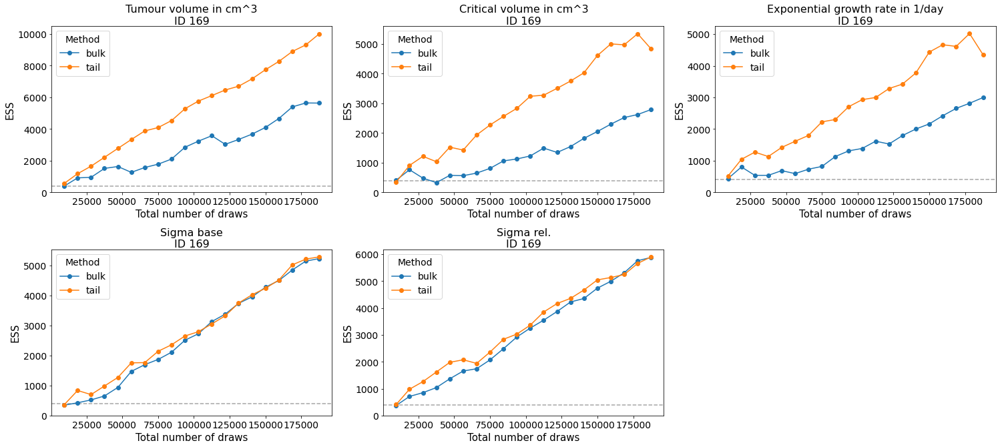

In [13]:
az.plot_ess(posterior_samples.sel(draw=slice(warmup, n_iterations)), kind="evolution")
plt.show()

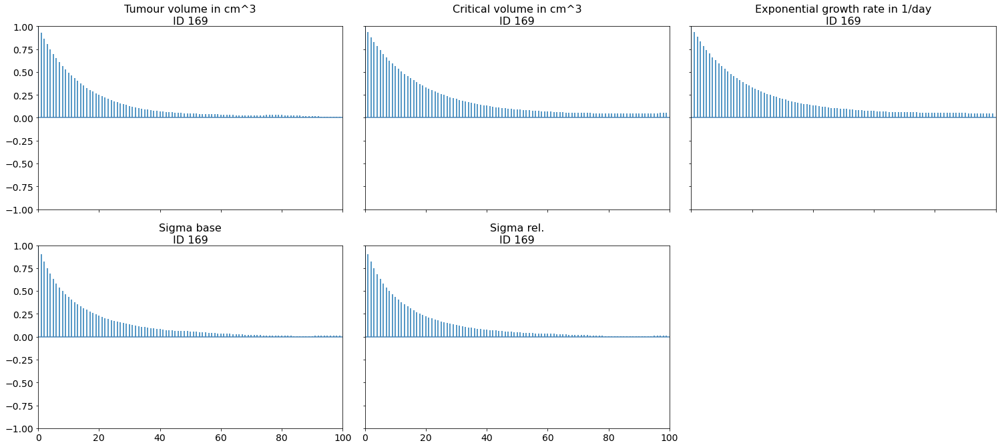

In [14]:
az.plot_autocorr(posterior_samples.sel(draw=slice(warmup, n_iterations)), combined=True)
plt.show()

### Reduce correlations by thinning out

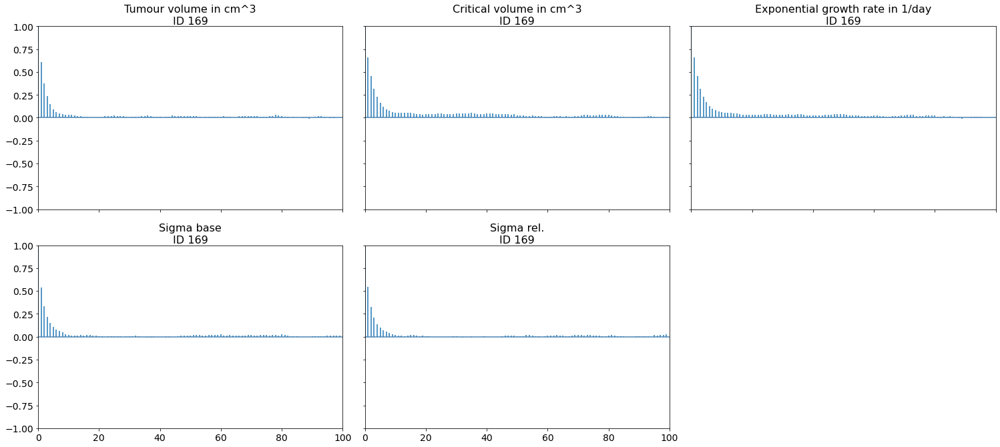

In [23]:
thinning_ratio = 7

az.plot_autocorr(posterior_samples.sel(draw=slice(warmup, n_iterations, thinning_ratio)), combined=True)
plt.show()

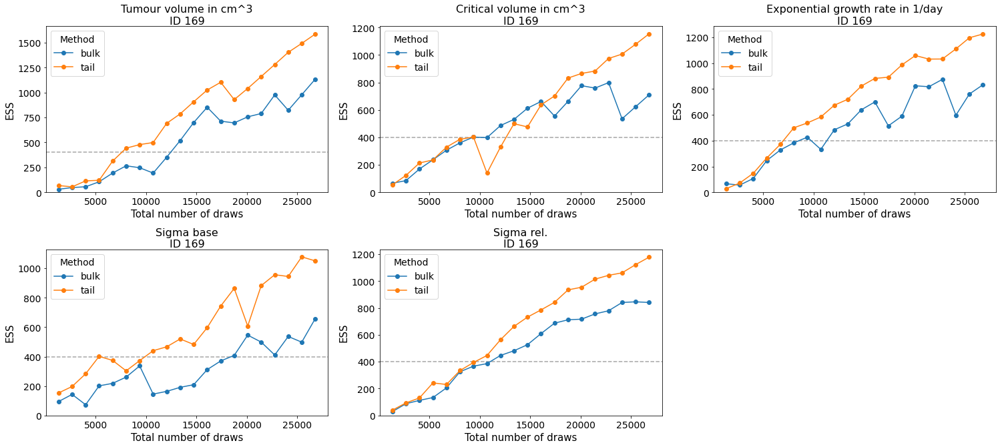

In [24]:
az.plot_ess(posterior_samples.sel(draw=slice(warmup, n_iterations, thinning_ratio)), kind="evolution")
plt.show()

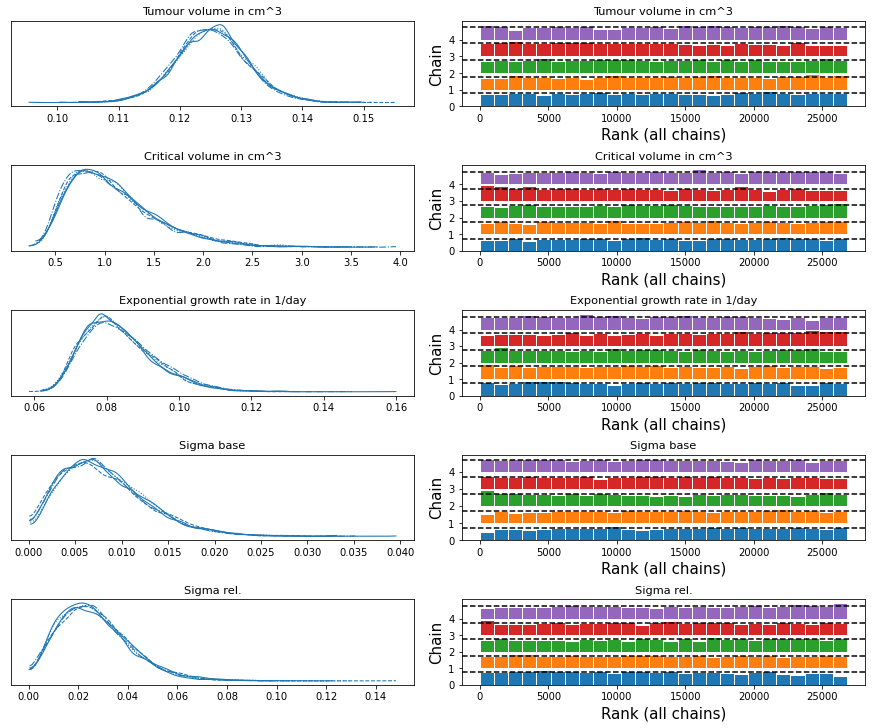

In [25]:
az.plot_trace(posterior_samples.sel(draw=slice(warmup, n_iterations, thinning_ratio)), kind='rank_bars')
plt.show()

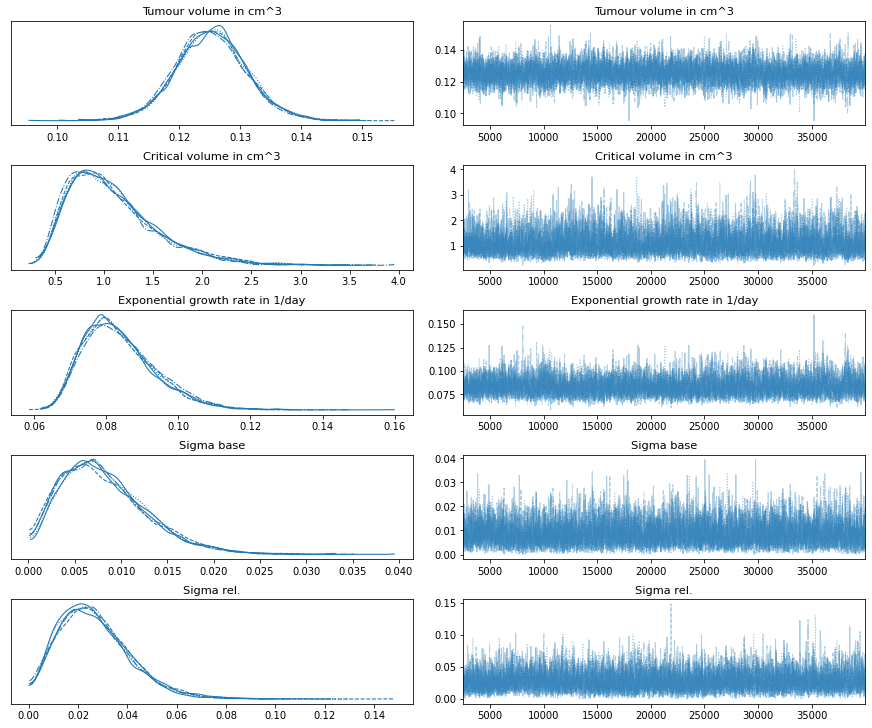

In [26]:
az.plot_trace(posterior_samples.sel(draw=slice(warmup, n_iterations, thinning_ratio)))
plt.show()

## Save posterior

In [27]:
import os

# Rename parameters
temp = xarray_samples.rename({
    'Tumour volume in cm^3': 'initial_tumour_volume',
    'Critical volume in cm^3': 'critical_volume',
    'Exponential growth rate in 1/day': 'growth_rate',
    'Sigma base': 'sigma_base',
    'Sigma rel.': 'sigma_rel'})

# Export samples
directory = os.getcwd()
name = '/posteriors/id_169.nc'
temp.sel(draw=slice(warmup, n_iterations, thinning_ratio)).to_netcdf(directory + name)

## Evaluate model

### Compute pointwise log-likelihood

In [5]:
import os
import xarray as xr

# Get log-likelihood
log_likelihood = log_posteriors.get_log_likelihood()

# Get posterior samples
directory = os.getcwd()
posterior_samples = xr.open_dataset(directory + '/posteriors/id_169.nc')

# Compute pointwise log-likelihood
param_map = {
    'Tumour volume in cm^3': 'initial_tumour_volume',
    'Critical volume in cm^3': 'critical_volume',
    'Exponential growth rate in 1/day': 'growth_rate',
    'Sigma base': 'sigma_base',
    'Sigma rel.': 'sigma_rel'}
inference_data = erlo.compute_pointwise_loglikelihood(
    log_likelihood, posterior_samples, param_map=param_map, return_inferencedata=True)

### Compute LOO and WAIC

In [6]:
import arviz as az

az.loo(inference_data)

Computed from 26790 by 14 log-likelihood matrix

         Estimate       SE
elpd_loo    36.38     2.13
p_loo        2.87        -

In [7]:
az.waic(inference_data)

/Users/david/Documents/SABS/DPhil/erlotinib/venv/lib/python3.7/site-packages/arviz/stats/stats.py:1407: UserWarning:

For one or more samples the posterior variance of the log predictive densities exceeds 0.4. This could be indication of WAIC starting to fail. 
See http://arxiv.org/abs/1507.04544 for details



Computed from 26790 by 14 log-likelihood matrix

          Estimate       SE
elpd_waic    36.65     2.04
p_waic        2.60        -

There has been a warning during the calculation. Please check the results.

### Store inference data

In [8]:
inference_data.to_netcdf(directory + '/posteriors/id_169_inference_data.nc');